## Prophet

- 사용자가 선택한 업종에 대해 자치구별로 Prophet 시계열 모델을 적용하여 **폐업률, 점포당 평균 매출, 밀집도**의 미래 값을 예측
- 이를 기반으로 종합 스코어를 계산하여 **창업에 가장 유리한 자치구를 추천**
- 예측 시점 : 다음 분기, 또는 2분기 후
- 다음 분기를 기준으로 종합스코어 계산
- 밀집도는 시계열 예측이 어려움 -> 밀집도 = 유사 업종 점포 수 / 상권 면적
- 상권 면적이 면하는 변수가 아님
- 분모는 고정이고 분자만 변하는 상황인데, 이런 상황이라면 유사업종 점포수만 예측하는 게 맞음
- 밀집도는 계절성, 추세가 약함
- 가장 최근 분기의 밀집도를 그대로 사용하는 것이 나은 방법
- 최근 n개 분기의 평균값 사용 (moving average 방식)
- 대체 변수1 : 유동인구 대비 점포수 ( 포화 상태 판단, 수요 대비 공급)
- 대체 변수2 : 자치구 내 업종 점유율 (특정 업종의 우세 여부, 시장 점유 경쟁도)


In [ ]:
# 라이브러리
import pandas as pd 
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import chi2_contingency, kruskal, shapiro, pearsonr, spearmanr
#import scikit_posthocs as sp
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler, QuantileTransformer
from sklearn.cluster import KMeans, DBSCAN
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score, silhouette_samples
from yellowbrick.cluster import KElbowVisualizer
import matplotlib.cm as cm
import koreanize_matplotlib

df_area = pd.read_csv("서울시 상권분석서비스(영역-상권).csv", encoding='cp949')
df_income = pd.read_csv("서울시 상권분석서비스(소득소비-자치구).csv", encoding='cp949')
df_sales = pd.read_csv("서울시 상권분석서비스(추정매출-자치구).csv", encoding='cp949')
df_store = pd.read_csv("서울시 상권분석서비스(점포-자치구).csv", encoding="cp949")
df_income['기준_년분기_코드'].unique()

#데이터 병합 및 전처리
## 칼럼명 변경
df_area = df_area.rename(columns={
    "자치구_코드_명": "자치구",
    "영역_면적": "상권면적"
})

df_income = df_income.rename(columns={
    "행정동_코드_명": "자치구",
    "지출_총금액": "총지출",
    "월_평균_소득_금액": "평균소득"
})

df_sales = df_sales.rename(columns={
    "자치구_코드_명": "자치구",
    "당월_매출_금액": "총추정매출",
    "서비스_업종_코드_명": "업종명"
})

df_store = df_store.rename(columns={
    "자치구_코드_명": "자치구",
    "점포_수": "점포수",
    "서비스_업종_코드_명": "업종명",
    "유사_업종_점포_수": "유사점포수",
    "폐업_점포_수": "폐업점포수",
    "폐업_률": "폐업률"
})

## 업종 매핑
category_map = {
    '외식업': ['한식음식점', '일식음식점', '중식음식점', '양식음식점', '치킨전문점', '분식전문점', '패스트푸드점', '호프-간이주점'],
    '카페/디저트' : ['커피-음료', '제과점'],
    '소매/도소매': ['편의점', '서적', '가구', '가방', '가전제품', '문구', '미곡판매', '미용재료', '수산물판매', '슈퍼마켓', '시계및귀금속', '신발', '악기', '안경',
                 '예술품', '운동/경기용품', '육류판매', '의료기기', '의류임대', '의약품', '재생용품 판매점',
                 '전자상거래업', '조명용품', '주류도매', '중고가구', '중고차판매', '철물점', '청과상', '컴퓨터및주변장치판매', '핸드폰', '화장품', '화초'],
    '뷰티/건강': ['미용실', '네일숍', '피부관리실', '동물병원', '일반의원', '치과의원', '한의원'],
    '유아/아동 관련': ['완구', '유아의류'],
    '교육': ['독서실', '예술학원', '외국어학원', '일반교습학원', '컴퓨터학원', '스포츠 강습'],
    '생활 서비스': ['가전제품수리', '가정용품임대', '건축물청소', '세탁소', '사진관', '세무사사무소', '법무사사무소', '변리사사무소', '변호사사무소',
                 '통번역서비스', '통신기기수리', '회계사사무소', '인테리어', '기타법무서비스'],
    '자동차/운송': ['모터사이클및부품', '모터사이클수리', '자동차미용', '자동차부품', '자동차수리', '자전거 및 기타운송장비', '주유소'],
    '주거/부동산': ['부동산중개업', '고시원'],
    '숙박/배달': ['게스트하우스', '여관', '여행사'],
    '엔터테인먼트/오락': ['DVD방', 'PC방', '노래방', '녹음실', '당구장', '볼링장',
                  '전자게임장', '기타오락장', '복권방', '스포츠클럽', '골프연습장', '비디오/서적임대'],
    '패션/의류': ['섬유제품', '한복점', '일반의류',]
}

reverse_map = {}
for category, 업종들 in category_map.items():
    for 업종 in 업종들:
        reverse_map[업종] = category

df_store["대분류"] = df_store["업종명"].map(reverse_map)
df_sales["대분류"] = df_sales["업종명"].map(reverse_map)


# 연도 칼럼
df_store["year"] = df_store["기준_년분기_코드"] // 10
df_sales["year"] = df_sales["기준_년분기_코드"] // 10
df_income["year"] = df_income["기준_년분기_코드"] // 10


# 매출 데이터 집계(해당 분기 자치구-업종별 총추정매출)
df_sales_agg = df_sales.groupby(
    ["기준_년분기_코드", "자치구", "업종명"], as_index=False
).agg({
    "총추정매출": "sum"
})

## 자치구별 면적 계산
df_area_agg = df_area.groupby("자치구", as_index=False)["상권면적"].sum()
df_region_area = df_area_agg[["자치구", "상권면적"]]


# 자치구별 연 단위 총지출 집계
df_income_agg = df_income.groupby(["자치구", "year"], as_index=False).agg({
    "총지출": "sum",
    "평균소득": "mean"
})
df_region_income = df_income_agg[["자치구", "year", "총지출", "평균소득"]]

df_merged = pd.merge(
    df_store[[
        "기준_년분기_코드", "자치구", "업종명", "대분류",
        "점포수", "유사점포수", "폐업점포수", "폐업률", "year"
    ]],
    df_sales_agg,
    on=["기준_년분기_코드", "자치구", "업종명"],
    how="left"
)

df_region = pd.merge(
    df_merged,
    df_income_agg,
    on=["자치구", "year"],
    how="left"
)

df_final = pd.merge(
    df_region,
    df_area_agg[["자치구", "상권면적"]],
    on="자치구",
    how="left"
)

## 분기
quarter_code = 20234

df_final_2023 = df_final[df_final["year"] == 2023].copy()
df_final_q4 = df_final[df_final["기준_년분기_코드"] == quarter_code].copy()
df_final.shape


df_final.tail()
df_final['기준_년분기_코드'].unique()

df_final.head()


p_df=pd.read_csv('./서울시 상권분석서비스(길단위인구-자치구).csv',encoding='cp949') 
p_df.head()
p_df['기준_년분기_코드'].unique()

p_df.head()
# 컬럼명 일치시키기
p_df = p_df.rename(columns={'자치구_코드_명': '자치구'})

df_final['기준_년분기_코드'] = df_final['기준_년분기_코드'].astype(int)
p_df['기준_년분기_코드'] = p_df['기준_년분기_코드'].astype(int)

df_merged = pd.merge(
    df_final,
    p_df[['기준_년분기_코드', '자치구', '총_유동인구_수']],
    on=['기준_년분기_코드', '자치구'],
    how='left'  # 유동인구 없는 자치구도 유지
)



# 1. 폐업률 (% 단위)
df_merged['폐업률'] = df_merged.apply(
    lambda row: (row['폐업점포수'] / row['점포수'] * 100) if row['점포수'] > 0 else 0,
    axis=1
)

# 2. 밀집도
df_merged['밀집도'] = df_merged.apply(
    lambda row: (row['유사점포수'] / row['상권면적']) if row['상권면적'] > 0 else 0,
    axis=1
)

# 3. 점포당 평균 매출
df_merged['점포당_평균_매출'] = df_merged.apply(
    lambda row: (row['총추정매출'] / row['점포수']) if row['점포수'] > 0 else 0,
    axis=1
)


In [6]:
df_merged.head()

,기준_년분기_코드,자치구,업종명,대분류,점포수,폐업점포수,폐업률,year,총추정매출,총지출,평균소득,상권면적,총_유동인구_수,밀집도,점포당_평균_매출
0,20244,강동구,전자상거래업,소매/도소매,1100.0,63.0,5.727273,2024,60224799.0,417853383000,3292857.0,5761011,107151778,0.000191,54749.817273
1,20244,강동구,주유소,자동차/운송,39.0,0.0,0.000000,2024,NaN,417853383000,3292857.0,5761011,107151778,0.000007,NaN
2,20244,강동구,예술품,소매/도소매,26.0,0.0,0.000000,2024,NaN,417853383000,3292857.0,5761011,107151778,0.000005,NaN
3,20244,강동구,재생용품 판매점,소매/도소매,47.0,0.0,0.000000,2024,NaN,417853383000,3292857.0,5761011,107151778,0.000008,NaN
4,20244,강동구,모터사이클및부품,자동차/운송,20.0,0.0,0.000000,2024,NaN,417853383000,3292857.0,5761011,107151778,0.000003,NaN


In [8]:
df_merged['기준_년분기_코드'].unique()

array([20244, 20243, 20242, 20241, 20234, 20233, 20232, 20231, 20224,
       20223, 20222, 20221, 20214, 20213, 20212, 20211, 20204, 20203,
       20202, 20201, 20194, 20193, 20192, 20191])

In [9]:
# 2019 1분기 ~2024 4분기

In [10]:
df_merged['기준_년분기_코드'].value_counts()

기준_년분기_코드
20203    2499
20201    2491
20202    2491
20244    2490
20192    2490
20193    2490
20194    2490
20211    2489
20204    2489
20191    2489
20221    2488
20212    2488
20222    2487
20213    2487
20223    2487
20224    2487
20232    2487
20233    2487
20234    2487
20241    2487
20214    2487
20243    2486
20231    2486
20242    2486
Name: count, dtype: int64

In [11]:
df_merged.to_csv('./prophet.csv', index=False, encoding='utf-8-sig')    

In [12]:
df_merged.head()

,기준_년분기_코드,자치구,업종명,대분류,점포수,폐업점포수,폐업률,year,총추정매출,총지출,평균소득,상권면적,총_유동인구_수,밀집도,점포당_평균_매출
0,20244,강동구,전자상거래업,소매/도소매,1100.0,63.0,5.727273,2024,60224799.0,417853383000,3292857.0,5761011,107151778,0.000191,54749.817273
1,20244,강동구,주유소,자동차/운송,39.0,0.0,0.000000,2024,NaN,417853383000,3292857.0,5761011,107151778,0.000007,NaN
2,20244,강동구,예술품,소매/도소매,26.0,0.0,0.000000,2024,NaN,417853383000,3292857.0,5761011,107151778,0.000005,NaN
3,20244,강동구,재생용품 판매점,소매/도소매,47.0,0.0,0.000000,2024,NaN,417853383000,3292857.0,5761011,107151778,0.000008,NaN
4,20244,강동구,모터사이클및부품,자동차/운송,20.0,0.0,0.000000,2024,NaN,417853383000,3292857.0,5761011,107151778,0.000003,NaN


In [13]:
df_merged.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 59725 entries, 0 to 59724
Data columns (total 15 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   기준_년분기_코드  59725 non-null  int64  
 1   자치구        59725 non-null  object 
 2   업종명        59725 non-null  object 
 3   대분류        58525 non-null  object 
 4   점포수        59725 non-null  float64
 5   폐업점포수      59725 non-null  float64
 6   폐업률        59725 non-null  float64
 7   year       59725 non-null  int64  
 8   총추정매출      36909 non-null  float64
 9   총지출        59725 non-null  int64  
 10  평균소득       59725 non-null  float64
 11  상권면적       59725 non-null  int64  
 12  총_유동인구_수   59725 non-null  int64  
 13  밀집도        59725 non-null  float64
 14  점포당_평균_매출  36930 non-null  float64
dtypes: float64(7), int64(5), object(3)
memory usage: 6.8+ MB


### 대체 변수 생성

In [14]:
# 유동인구 대비 점포 수
df_merged['유동인구_대비_점포'] = df_merged['점포수'] / df_merged['총_유동인구_수']

# 자치구 내 업종 점유율
df_merged['자치구_업종_점유율'] = df_merged.groupby('자치구')['점포수'].transform(lambda x: x / x.sum())


In [15]:
df_merged.head(3)

,기준_년분기_코드,자치구,업종명,대분류,점포수,폐업점포수,폐업률,year,총추정매출,총지출,평균소득,상권면적,총_유동인구_수,밀집도,점포당_평균_매출,유동인구_대비_점포,자치구_업종_점유율
0,20244,강동구,전자상거래업,소매/도소매,1100.0,63.0,5.727273,2024,60224799.0,417853383000,3292857.0,5761011,107151778,0.000191,54749.817273,1.026581e-05,0.002152
1,20244,강동구,주유소,자동차/운송,39.0,0.0,0.000000,2024,NaN,417853383000,3292857.0,5761011,107151778,0.000007,NaN,3.639697e-07,0.000076
2,20244,강동구,예술품,소매/도소매,26.0,0.0,0.000000,2024,NaN,417853383000,3292857.0,5761011,107151778,0.000005,NaN,2.426465e-07,0.000051


In [16]:
df_merged.isna().sum()

기준_년분기_코드         0
자치구               0
업종명               0
대분류            1200
점포수               0
폐업점포수             0
폐업률               0
year              0
총추정매출         22816
총지출               0
평균소득              0
상권면적              0
총_유동인구_수          0
밀집도               0
점포당_평균_매출     22795
유동인구_대비_점포        0
자치구_업종_점유율        0
dtype: int64

### 자치구-업종별 : 유동인구 대비 점포, 자치구 업종 점유율 유의미성 판정

In [17]:
# 유동인구_대비_점포, 자치구_업종_점유율은 연속형이지만 정규성 보장 어려움
# 값의 분포를 확인해보면 매우 작고 편향된 값들 있음 -> 정규성 가정 어려움

In [18]:
# 유동인구_대비_점포	수요 대비 점포수 (포화도)	대부분 작고 편차 큼	정규성 없음 가능성 높음
# 자치구_업종_점유율	자치구 내 특정 업종 비중	0.00001 ~ 0.02 수준	정규성 없음 가능성 높음

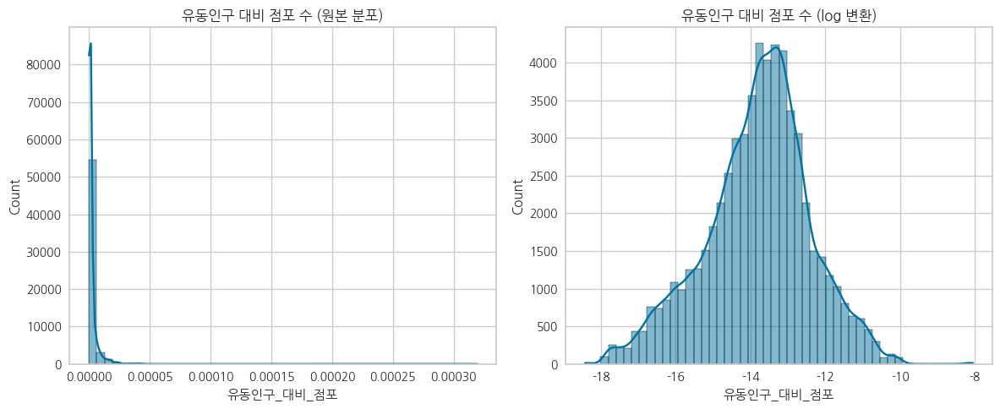

In [19]:
# 1. 유동인구_대비_점포 분포 (원본 & log)
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
sns.histplot(df_merged['유동인구_대비_점포'], bins=50, kde=True)
plt.title("유동인구 대비 점포 수 (원본 분포)")

plt.subplot(1, 2, 2)
sns.histplot(np.log(df_merged['유동인구_대비_점포'] + 1e-8), bins=50, kde=True)
plt.title("유동인구 대비 점포 수 (log 변환)")

plt.tight_layout()
plt.show()

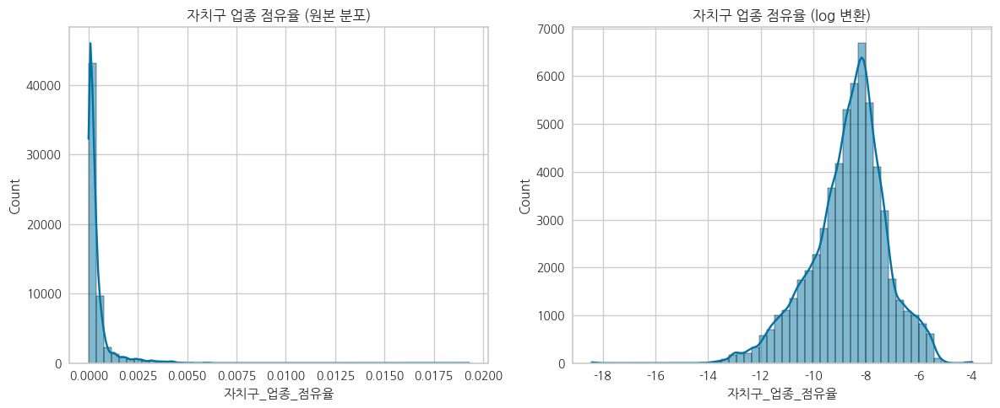

In [20]:
# 2. 자치구_업종_점유율 분포 (원본 & log)
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
sns.histplot(df_merged['자치구_업종_점유율'], bins=50, kde=True)
plt.title("자치구 업종 점유율 (원본 분포)")

plt.subplot(1, 2, 2)
sns.histplot(np.log(df_merged['자치구_업종_점유율'] + 1e-8), bins=50, kde=True)
plt.title("자치구 업종 점유율 (log 변환)")

plt.tight_layout()
plt.show()


In [21]:
from scipy.stats import kruskal

# 1. 자치구-업종 그룹별 유동인구 대비 점포 수 리스트 생성
grouped1 = df_merged.groupby(['자치구', '업종명'])['유동인구_대비_점포'].apply(list).reset_index()
groups1 = [group for group in grouped1['유동인구_대비_점포'] if len(group) > 1]

# Kruskal-Wallis 검정 수행 (유동인구 대비 점포 수)
stat1, pval1 = kruskal(*groups1)
print(f"유동인구 대비 점포수 검정 결과: H={stat1:.4f}, p-value={pval1:.4f}")

# 2. 자치구-업종 그룹별 업종 점유율 리스트 생성
grouped2 = df_merged.groupby(['자치구', '업종명'])['자치구_업종_점유율'].apply(list).reset_index()
groups2 = [group for group in grouped2['자치구_업종_점유율'] if len(group) > 1]

# Kruskal-Wallis 검정 수행 (자치구 업종 점유율)
stat2, pval2 = kruskal(*groups2)
print(f"자치구 업종 점유율 검정 결과: H={stat2:.4f}, p-value={pval2:.4f}")


유동인구 대비 점포수 검정 결과: H=59231.6978, p-value=0.0000
자치구 업종 점유율 검정 결과: H=59323.2341, p-value=0.0000


In [22]:
# 둘 다 유의미한 차이 있음을 확인

### 자치구-업종별: 유동인구 

In [23]:
# 유동인구를 자치구-업종 단위로 그룹화
grouped = df_merged.groupby(['자치구', '업종명'])['총_유동인구_수'].apply(list).reset_index()

# 2개 이상 관측값이 있는 그룹만 추출
valid_groups = [group for group in grouped['총_유동인구_수'] if len(group) > 1]

# Kruskal-Wallis 검정 수행
stat, pval = kruskal(*valid_groups)
stat, pval

(np.float64(58267.551707397164), np.float64(0.0))

### 안정성(폐업률) + 수익성(매출) + 수요(유동인구)

- 전체 자치구-업종 조합에서 폐업률 예측 실행

In [24]:
from prophet import Prophet

# 기준 분기 → 날짜 변환 함수
def convert_quarter_to_date(code):
    year = str(code)[:4]
    quarter = str(code)[-1]
    month = {'1': '01', '2': '04', '3': '07', '4': '10'}.get(quarter, '01')
    return pd.to_datetime(f"{year}-{month}-01")

# 변수별 예측 함수
def prophet_forecast(df, gu, upjong, target_col, periods=2):
    df_subset = df[(df['자치구'] == gu) & (df['업종명'] == upjong)]
    df_subset = df_subset[['기준_년분기_코드', target_col]].dropna()

    if len(df_subset) < 4:
        return None  # 시계열 길이 너무 짧으면 예측 생략

    df_prophet = df_subset.rename(columns={target_col: 'y'})
    df_prophet['ds'] = df_prophet['기준_년분기_코드'].apply(convert_quarter_to_date)
    df_prophet = df_prophet[['ds', 'y']]

    model = Prophet()
    model.fit(df_prophet)

    future = model.make_future_dataframe(periods=periods, freq='Q')
    forecast = model.predict(future)

    return forecast[['ds', 'yhat']].tail(periods)

# 예시: 전체 자치구-업종 조합에서 폐업률 예측 실행
result_list = []

for gu in df_merged['자치구'].unique():
    for upjong in df_merged[df_merged['자치구'] == gu]['업종명'].unique():
        forecast = prophet_forecast(df_merged, gu, upjong, '폐업률', periods=1)
        if forecast is not None:
            predicted_value = forecast['yhat'].values[-1]
            result_list.append({
                '자치구': gu,
                '업종명': upjong,
                '예측_폐업률': predicted_value
            })

df_predictions = pd.DataFrame(result_list)


/Users/leehyunjoo/Library/Python/3.9/lib/python/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
Importing plotly failed. Interactive plots will not work.
23:48:38 - cmdstanpy - INFO - Chain [1] start processing
23:48:38 - cmdstanpy - INFO - Chain [1] done processing
/Users/leehyunjoo/Library/Python/3.9/lib/python/site-packages/prophet/forecaster.py:1854: FutureWarning: 'Q' is deprecated and will be removed in a future version, please use 'QE' instead.
  dates = pd.date_range(
23:48:38 - cmdstanpy - INFO - Chain [1] start processing
23:48:38 - cmdstanpy - INFO - Chain [1] done processing
/Users/leehyunjoo/Library/Python/3.9/lib/python/site-packages/prophet/forecaster.py:1854: FutureWarning: 'Q' is deprecated and will be removed in a future version, please use 'QE' instead.
  dates = pd.date_range(
23:48:38 - cmdstanpy 

### train-test 폐업률

In [ ]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score


# 분기 코드 → 날짜 변환 함수
def convert_quarter_to_date(code):
    year = str(code)[:4]
    quarter = str(code)[-1]
    month = {'1': '01', '2': '04', '3': '07', '4': '10'}.get(quarter, '01')
    return pd.to_datetime(f"{year}-{month}-01")

# 1. 예측 대상 설정
gu = '강남구'
upjong = '가전제품수리'

# 2. 데이터 필터링 및 전처리
df_sub = df_merged[(df_merged['자치구'] == gu) & (df_merged['업종명'] == upjong)][['기준_년분기_코드', '폐업률']].dropna()

if len(df_sub) < 6:
    print("❗ 데이터가 충분하지 않습니다.")
else:
    df_sub['ds'] = df_sub['기준_년분기_코드'].apply(convert_quarter_to_date)
    df_sub = df_sub.rename(columns={'폐업률': 'y'})[['ds', 'y']].sort_values(by='ds')

    # 3. train/test 분할
    train = df_sub.iloc[:-2]
    test = df_sub.iloc[-2:]

    # 4. Prophet 모델 학습 및 예측
    model = Prophet()
    model.fit(train)

    future = model.make_future_dataframe(periods=2, freq='Q')
    forecast = model.predict(future)

    # 5. 날짜 병합용 문자열 처리
    # 날짜 병합용 문자열 변환
    forecast['date_str'] = forecast['ds'].dt.to_period('Q').astype(str)
    test['date_str'] = test['ds'].dt.to_period('Q').astype(str)

    # 병합
    df_result = forecast[['date_str', 'yhat']].merge(test[['date_str', 'y']], on='date_str', how='inner')

    if not df_result.empty:
        mae = mean_absolute_error(df_result['y'], df_result['yhat'])
        rmse = np.sqrt(mean_squared_error(df_result['y'], df_result['yhat']))
        r2 = r2_score(df_result['y'], df_result['yhat'])

        print("Prophet 평가 결과 (강남구 - 가전제품수리)")
        print(f"MAE : {mae:.4f}")
        print(f"RMSE: {rmse:.4f}")
        print(f"R²  : {r2:.4f}")
        print("\n예측 결과:")
        print(df_result)
    else:
        print("병합 실패: 날짜가 맞지 않거나 예측이 충분하지 않습니다.")


18:44:00 - cmdstanpy - INFO - Chain [1] start processing


18:44:00 - cmdstanpy - INFO - Chain [1] done processing


📌 Prophet 평가 결과 (강남구 - 가전제품수리)
MAE : 1.4383
RMSE: 1.4383
R²  : nan

예측 결과:
  date_str      yhat         y
0   2024Q3  0.271054  1.709402


/Users/leehyunjoo/Library/Python/3.9/lib/python/site-packages/prophet/forecaster.py:1854: FutureWarning: 'Q' is deprecated and will be removed in a future version, please use 'QE' instead.
  dates = pd.date_range(
/var/folders/q9/1gz00szn5vz5011w8pll4_8h0000gn/T/ipykernel_1173/3586348035.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['date_str'] = test['ds'].dt.to_period('Q').astype(str)
/Users/leehyunjoo/Library/Python/3.9/lib/python/site-packages/sklearn/metrics/_regression.py:1266: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


### train-test 유동인구수

In [25]:
from prophet import Prophet
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import pandas as pd
import numpy as np

# 분기 코드 → 날짜 변환 함수
def convert_quarter_to_date(code):
    year = str(code)[:4]
    quarter = str(code)[-1]
    month = {'1': '01', '2': '04', '3': '07', '4': '10'}.get(quarter, '01')
    return pd.to_datetime(f"{year}-{month}-01")

# 1. 예측 대상 설정
gu = '강남구'
upjong = '가전제품수리'

# 2. 데이터 필터링 및 전처리
df_sub = df_merged[(df_merged['자치구'] == gu) & (df_merged['업종명'] == upjong)][['기준_년분기_코드', '총_유동인구_수']].dropna()

if len(df_sub) < 6:
    print("❗ 데이터가 충분하지 않습니다.")
else:
    df_sub['ds'] = df_sub['기준_년분기_코드'].apply(convert_quarter_to_date)
    df_sub = df_sub.rename(columns={'총_유동인구_수': 'y'})[['ds', 'y']].sort_values(by='ds')

    # 3. train/test 분할
    train = df_sub.iloc[:-2]
    test = df_sub.iloc[-2:]

    # 4. Prophet 모델 학습 및 예측
    model = Prophet()
    model.fit(train)

    future = model.make_future_dataframe(periods=2, freq='Q')
    forecast = model.predict(future)

    # 5. 날짜 병합용 문자열 처리
    # 날짜 병합용 문자열 변환
    forecast['date_str'] = forecast['ds'].dt.to_period('Q').astype(str)
    test['date_str'] = test['ds'].dt.to_period('Q').astype(str)

    # 병합
    df_result = forecast[['date_str', 'yhat']].merge(test[['date_str', 'y']], on='date_str', how='inner')

    if not df_result.empty:
        mae = mean_absolute_error(df_result['y'], df_result['yhat'])
        rmse = np.sqrt(mean_squared_error(df_result['y'], df_result['yhat']))
        r2 = r2_score(df_result['y'], df_result['yhat'])

        print("Prophet 평가 결과 (강남구 - 가전제품수리)")
        print(f"MAE : {mae:.4f}")
        print(f"RMSE: {rmse:.4f}")
        print(f"R²  : {r2:.4f}")
        print("\n예측 결과:")
        print(df_result)
    else:
        print("병합 실패: 날짜가 맞지 않거나 예측이 충분하지 않습니다.")


00:01:23 - cmdstanpy - INFO - Chain [1] start processing
00:01:23 - cmdstanpy - INFO - Chain [1] done processing


Prophet 평가 결과 (강남구 - 가전제품수리)
MAE : 1720241.7365
RMSE: 1720241.7365
R²  : nan

예측 결과:
  date_str          yhat          y
0   2024Q3  1.468849e+08  145164613


/Users/leehyunjoo/Library/Python/3.9/lib/python/site-packages/prophet/forecaster.py:1854: FutureWarning: 'Q' is deprecated and will be removed in a future version, please use 'QE' instead.
  dates = pd.date_range(
/var/folders/q9/1gz00szn5vz5011w8pll4_8h0000gn/T/ipykernel_1193/1649278891.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['date_str'] = test['ds'].dt.to_period('Q').astype(str)
/Users/leehyunjoo/Library/Python/3.9/lib/python/site-packages/sklearn/metrics/_regression.py:1266: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


### 총 유동인구 수

In [26]:
from prophet import Prophet
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import pandas as pd
import numpy as np

# 분기 코드 → 날짜 변환 함수
def convert_quarter_to_date(code):
    year = str(code)[:4]
    quarter = str(code)[-1]
    month = {'1': '01', '2': '04', '3': '07', '4': '10'}.get(quarter, '01')
    return pd.to_datetime(f"{year}-{month}-01")

# Prophet 예측 및 평가 함수 (총 유동인구 수 예측)
def prophet_evaluate(df, gu, upjong, target='총_유동인구_수', test_periods=2):
    df_sub = df[(df['자치구'] == gu) & (df['업종명'] == upjong)][['기준_년분기_코드', target]].dropna()

    if len(df_sub) < (test_periods + 4):
        return None  # 데이터 부족

    df_sub['ds'] = df_sub['기준_년분기_코드'].apply(convert_quarter_to_date)
    df_sub = df_sub.rename(columns={target: 'y'})[['ds', 'y']].sort_values(by='ds')

    train = df_sub.iloc[:-test_periods]
    test = df_sub.iloc[-test_periods:]

    model = Prophet()
    model.fit(train)

    future = model.make_future_dataframe(periods=test_periods, freq='Q')
    forecast = model.predict(future)

    forecast['date_str'] = forecast['ds'].dt.to_period('Q').astype(str)
    test['date_str'] = test['ds'].dt.to_period('Q').astype(str)
    df_result = forecast[['date_str', 'yhat']].merge(test[['date_str', 'y']], on='date_str', how='inner')

    if df_result.empty:
        return None

    mae = mean_absolute_error(df_result['y'], df_result['yhat'])
    rmse = np.sqrt(mean_squared_error(df_result['y'], df_result['yhat']))
    r2 = r2_score(df_result['y'], df_result['yhat'])

    return {
        '자치구': gu,
        '업종명': upjong,
        'MAE': mae,
        'RMSE': rmse,
        'R2': r2,
        'Test Sample': len(df_result)
    }

# 전체 자치구-업종 반복 수행
results = []

for gu in df_merged['자치구'].unique():
    for upjong in df_merged[df_merged['자치구'] == gu]['업종명'].unique():
        res = prophet_evaluate(df_merged, gu, upjong, target='총_유동인구_수', test_periods=2)
        if res:
            results.append(res)

# 결과 정리
df_results = pd.DataFrame(results)

# 일부 출력
print("📊 Prophet 전체 평가 결과 (총 유동인구 수 예측 - 일부 샘플):")
print(df_results.head())

# 전체 평균 성능 출력
if not df_results.empty:
    print("\n📈 전체 평균 성능 (총 유동인구 예측):")
    print("MAE 평균:", round(df_results['MAE'].mean(), 2))
    print("RMSE 평균:", round(df_results['RMSE'].mean(), 2))
    print("R² 평균 :", round(df_results['R2'].mean(), 4))
else:
    print("❗ 평가 결과가 없습니다.")


00:08:17 - cmdstanpy - INFO - Chain [1] start processing
00:08:17 - cmdstanpy - INFO - Chain [1] done processing
/Users/leehyunjoo/Library/Python/3.9/lib/python/site-packages/prophet/forecaster.py:1854: FutureWarning: 'Q' is deprecated and will be removed in a future version, please use 'QE' instead.
  dates = pd.date_range(
/var/folders/q9/1gz00szn5vz5011w8pll4_8h0000gn/T/ipykernel_1193/1757725016.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['date_str'] = test['ds'].dt.to_period('Q').astype(str)
/Users/leehyunjoo/Library/Python/3.9/lib/python/site-packages/sklearn/metrics/_regression.py:1266: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
00:08:17 - cmds

📊 Prophet 전체 평가 결과 (총 유동인구 수 예측 - 일부 샘플):
   자치구       업종명            MAE           RMSE  R2  Test Sample
0  강동구    전자상거래업  332768.745107  332768.745107 NaN            1
1  강동구       주유소  332768.745107  332768.745107 NaN            1
2  강동구       예술품  332768.745107  332768.745107 NaN            1
3  강동구  재생용품 판매점  332768.745107  332768.745107 NaN            1
4  강동구  모터사이클및부품  332768.745107  332768.745107 NaN            1

📈 전체 평균 성능 (총 유동인구 예측):
MAE 평균: 3373753.31
RMSE 평균: 3373753.31
R² 평균 : nan


/Users/leehyunjoo/Library/Python/3.9/lib/python/site-packages/prophet/forecaster.py:1854: FutureWarning: 'Q' is deprecated and will be removed in a future version, please use 'QE' instead.
  dates = pd.date_range(
/var/folders/q9/1gz00szn5vz5011w8pll4_8h0000gn/T/ipykernel_1193/1757725016.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['date_str'] = test['ds'].dt.to_period('Q').astype(str)
/Users/leehyunjoo/Library/Python/3.9/lib/python/site-packages/sklearn/metrics/_regression.py:1266: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


In [30]:

# 분기 코드 → 날짜 변환 함수
def convert_quarter_to_date(code):
    year = str(code)[:4]
    quarter = str(code)[-1]
    month = {'1': '01', '2': '04', '3': '07', '4': '10'}.get(quarter, '01')
    return pd.to_datetime(f"{year}-{month}-01")

# Prophet 예측 및 평가 함수 (총 유동인구 수 예측)
def prophet_evaluate(df, gu, upjong, target='폐업률', test_periods=3):
    df_sub = df[(df['자치구'] == gu) & (df['업종명'] == upjong)][['기준_년분기_코드', target]].dropna()

    if len(df_sub) < (test_periods + 4):
        return None  # 데이터 부족

    df_sub['ds'] = df_sub['기준_년분기_코드'].apply(convert_quarter_to_date)
    df_sub = df_sub.rename(columns={target: 'y'})[['ds', 'y']].sort_values(by='ds')

    train = df_sub.iloc[:-test_periods]
    test = df_sub.iloc[-test_periods:]

    model = Prophet()
    model.fit(train)

    future = model.make_future_dataframe(periods=test_periods, freq='Q')
    forecast = model.predict(future)

    forecast['date_str'] = forecast['ds'].dt.to_period('Q').astype(str)
    test['date_str'] = test['ds'].dt.to_period('Q').astype(str)
    df_result = forecast[['date_str', 'yhat']].merge(test[['date_str', 'y']], on='date_str', how='inner')

    if df_result.empty:
        return None

    mae = mean_absolute_error(df_result['y'], df_result['yhat'])
    rmse = np.sqrt(mean_squared_error(df_result['y'], df_result['yhat']))
    r2 = r2_score(df_result['y'], df_result['yhat'])

    return {
        '자치구': gu,
        '업종명': upjong,
        'MAE': mae,
        'RMSE': rmse,
        'R2': r2,
        'Test Sample': len(df_result)
    }

# 전체 자치구-업종 반복 수행
results = []

for gu in df_merged['자치구'].unique():
    for upjong in df_merged[df_merged['자치구'] == gu]['업종명'].unique():
        res = prophet_evaluate(df_merged, gu, upjong, target='폐업률', test_periods=3)
        if res:
            results.append(res)

# 결과 정리
df_results = pd.DataFrame(results)

# 일부 출력
print("📊 Prophet 전체 평가 결과 (총 폐업률 수 예측 - 일부 샘플):")
print(df_results.head())

# 전체 평균 성능 출력
if not df_results.empty:
    print("\n📈 전체 평균 성능 (총 폐업률 예측):")
    print("MAE 평균:", round(df_results['MAE'].mean(), 2))
    print("RMSE 평균:", round(df_results['RMSE'].mean(), 2))
    print("R² 평균 :", round(df_results['R2'].mean(), 4))
else:
    print("❗ 평가 결과가 없습니다.")


01:47:30 - cmdstanpy - INFO - Chain [1] start processing
01:47:30 - cmdstanpy - INFO - Chain [1] done processing
/Users/leehyunjoo/Library/Python/3.9/lib/python/site-packages/prophet/forecaster.py:1854: FutureWarning: 'Q' is deprecated and will be removed in a future version, please use 'QE' instead.
  dates = pd.date_range(
/var/folders/q9/1gz00szn5vz5011w8pll4_8h0000gn/T/ipykernel_1193/3951672234.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['date_str'] = test['ds'].dt.to_period('Q').astype(str)
01:47:30 - cmdstanpy - INFO - Chain [1] start processing
01:47:30 - cmdstanpy - INFO - Chain [1] done processing
/Users/leehyunjoo/Library/Python/3.9/lib/python/site-packages/prophet/forecaster.py:1854: FutureWarning: 'Q' is deprecated and w

📊 Prophet 전체 평가 결과 (총 폐업률 수 예측 - 일부 샘플):
   자치구       업종명       MAE      RMSE         R2  Test Sample
0  강동구    전자상거래업  0.489536  0.545508 -20.732887            2
1  강동구       주유소  4.317225  5.190164  -2.819544            2
2  강동구       예술품  2.247733  2.266147  -0.388618            2
3  강동구  재생용품 판매점  1.871579  2.019766  -2.604606            2
4  강동구  모터사이클및부품  5.607529  6.610510   0.000000            2

📈 전체 평균 성능 (총 폐업률 예측):
MAE 평균: 2.7
RMSE 평균: 3.08
R² 평균 : -3769.2728


/Users/leehyunjoo/Library/Python/3.9/lib/python/site-packages/prophet/forecaster.py:1854: FutureWarning: 'Q' is deprecated and will be removed in a future version, please use 'QE' instead.
  dates = pd.date_range(
/var/folders/q9/1gz00szn5vz5011w8pll4_8h0000gn/T/ipykernel_1193/3951672234.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['date_str'] = test['ds'].dt.to_period('Q').astype(str)


In [ ]:
# 분기 코드 → 날짜 변환 함수
def convert_quarter_to_date(code):
    year = str(code)[:4]
    quarter = str(code)[-1]
    month = {'1': '01', '2': '04', '3': '07', '4': '10'}.get(quarter, '01')
    return pd.to_datetime(f"{year}-{month}-01")

# Prophet 예측 및 평가 함수 (총 유동인구 수 예측)
def prophet_evaluate(df, gu, upjong, target='총_유동인구_수', test_periods=3):
    df_sub = df[(df['자치구'] == gu) & (df['업종명'] == upjong)][['기준_년분기_코드', target]].dropna()

    if len(df_sub) < (test_periods + 4):
        return None  # 데이터 부족

    df_sub['ds'] = df_sub['기준_년분기_코드'].apply(convert_quarter_to_date)
    df_sub = df_sub.rename(columns={target: 'y'})[['ds', 'y']].sort_values(by='ds')

    train = df_sub.iloc[:-test_periods]
    test = df_sub.iloc[-test_periods:]

    model = Prophet()
    model.fit(train)

    future = model.make_future_dataframe(periods=test_periods, freq='Q')
    forecast = model.predict(future)

    forecast['date_str'] = forecast['ds'].dt.to_period('Q').astype(str)
    test['date_str'] = test['ds'].dt.to_period('Q').astype(str)
    df_result = forecast[['date_str', 'yhat']].merge(test[['date_str', 'y']], on='date_str', how='inner')

    if df_result.empty:
        return None

    mae = mean_absolute_error(df_result['y'], df_result['yhat'])
    rmse = np.sqrt(mean_squared_error(df_result['y'], df_result['yhat']))
    r2 = r2_score(df_result['y'], df_result['yhat'])

    return {
        '자치구': gu,
        '업종명': upjong,
        'MAE': mae,
        'RMSE': rmse,
        'R2': r2,
        'Test Sample': len(df_result)
    }

# 전체 자치구-업종 반복 수행
results = []

for gu in df_merged['자치구'].unique():
    for upjong in df_merged[df_merged['자치구'] == gu]['업종명'].unique():
        res = prophet_evaluate(df_merged, gu, upjong, target='총_유동인구_수', test_periods=3)
        if res:
            results.append(res)

# 결과 정리
df_results = pd.DataFrame(results)

# 일부 출력
print("📊 Prophet 전체 평가 결과 (총 유동인구 수 예측 - 일부 샘플):")
print(df_results.head())

# 전체 평균 성능 출력
if not df_results.empty:
    print("\n📈 전체 평균 성능 (총 유동인구 예측):")
    print("MAE 평균:", round(df_results['MAE'].mean(), 2))
    print("RMSE 평균:", round(df_results['RMSE'].mean(), 2))
    print("R² 평균 :", round(df_results['R2'].mean(), 4))
else:
    print("❗ 평가 결과가 없습니다.")


00:49:37 - cmdstanpy - INFO - Chain [1] start processing
00:49:37 - cmdstanpy - INFO - Chain [1] done processing
/Users/leehyunjoo/Library/Python/3.9/lib/python/site-packages/prophet/forecaster.py:1854: FutureWarning: 'Q' is deprecated and will be removed in a future version, please use 'QE' instead.
  dates = pd.date_range(
/var/folders/q9/1gz00szn5vz5011w8pll4_8h0000gn/T/ipykernel_1193/2867717210.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['date_str'] = test['ds'].dt.to_period('Q').astype(str)
00:49:37 - cmdstanpy - INFO - Chain [1] start processing
00:49:37 - cmdstanpy - INFO - Chain [1] done processing
/Users/leehyunjoo/Library/Python/3.9/lib/python/site-packages/prophet/forecaster.py:1854: FutureWarning: 'Q' is deprecated and w

📊 Prophet 전체 평가 결과 (총 유동인구 수 예측 - 일부 샘플):
   자치구       업종명           MAE          RMSE         R2  Test Sample
0  강동구    전자상거래업  2.479145e+06  3.007997e+06 -48.017421            2
1  강동구       주유소  2.479145e+06  3.007997e+06 -48.017421            2
2  강동구       예술품  2.479145e+06  3.007997e+06 -48.017421            2
3  강동구  재생용품 판매점  2.479145e+06  3.007997e+06 -48.017421            2
4  강동구  모터사이클및부품  2.479145e+06  3.007997e+06 -48.017421            2

📈 전체 평균 성능 (총 유동인구 예측):
MAE 평균: 2829170.64
RMSE 평균: 3228476.58
R² 평균 : -12376.6529


### 점포당 평균 매출

In [29]:
from prophet import Prophet
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import pandas as pd
import numpy as np

# 분기 코드 → 날짜 변환 함수
def convert_quarter_to_date(code):
    year = str(code)[:4]
    quarter = str(code)[-1]
    month = {'1': '01', '2': '04', '3': '07', '4': '10'}.get(quarter, '01')
    return pd.to_datetime(f"{year}-{month}-01")

# Prophet 예측 및 평가 함수 (점포당_평균_매출 예측용)
def prophet_evaluate(df, gu, upjong, target='점포당_평균_매출', test_periods=3):
    df_sub = df[(df['자치구'] == gu) & (df['업종명'] == upjong)][['기준_년분기_코드', target]].dropna()

    if len(df_sub) < (test_periods + 4):  # 최소 학습 데이터 확보
        return None

    df_sub['ds'] = df_sub['기준_년분기_코드'].apply(convert_quarter_to_date)
    df_sub = df_sub.rename(columns={target: 'y'})[['ds', 'y']].sort_values(by='ds')

    train = df_sub.iloc[:-test_periods]
    test = df_sub.iloc[-test_periods:]

    model = Prophet()
    model.fit(train)

    future = model.make_future_dataframe(periods=test_periods, freq='Q')
    forecast = model.predict(future)

    forecast['date_str'] = forecast['ds'].dt.to_period('Q').astype(str)
    test['date_str'] = test['ds'].dt.to_period('Q').astype(str)

    df_result = forecast[['date_str', 'yhat']].merge(test[['date_str', 'y']], on='date_str', how='inner')

    if df_result.empty:
        return None

    mae = mean_absolute_error(df_result['y'], df_result['yhat'])
    rmse = np.sqrt(mean_squared_error(df_result['y'], df_result['yhat']))
    r2 = r2_score(df_result['y'], df_result['yhat'])

    return {
        '자치구': gu,
        '업종명': upjong,
        'MAE': mae,
        'RMSE': rmse,
        'R2': r2,
        'Test Sample': len(df_result)
    }

# 전체 자치구-업종 반복 수행
results = []

for gu in df_merged['자치구'].unique():
    for upjong in df_merged[df_merged['자치구'] == gu]['업종명'].unique():
        res = prophet_evaluate(df_merged, gu, upjong, target='점포당_평균_매출', test_periods=3)
        if res:
            results.append(res)

# 결과 정리
df_results = pd.DataFrame(results)

# 일부 출력
print("📊 Prophet 전체 평가 결과 (점포당_평균_매출 예측 - 일부 샘플):")
print(df_results.head())

# 전체 평균 성능 출력
if not df_results.empty:
    print("\n📈 전체 평균 성능 (점포당_평균_매출 예측):")
    print("MAE 평균:", round(df_results['MAE'].mean(), 2))
    print("RMSE 평균:", round(df_results['RMSE'].mean(), 2))
    print("R² 평균 :", round(df_results['R2'].mean(), 4))
else:
    print("❗ 평가 결과가 없습니다.")


01:41:29 - cmdstanpy - INFO - Chain [1] start processing
01:41:29 - cmdstanpy - INFO - Chain [1] done processing
/Users/leehyunjoo/Library/Python/3.9/lib/python/site-packages/prophet/forecaster.py:1854: FutureWarning: 'Q' is deprecated and will be removed in a future version, please use 'QE' instead.
  dates = pd.date_range(
/var/folders/q9/1gz00szn5vz5011w8pll4_8h0000gn/T/ipykernel_1193/1092031116.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['date_str'] = test['ds'].dt.to_period('Q').astype(str)
01:41:29 - cmdstanpy - INFO - Chain [1] start processing
01:41:29 - cmdstanpy - INFO - Chain [1] done processing
/Users/leehyunjoo/Library/Python/3.9/lib/python/site-packages/prophet/forecaster.py:1854: FutureWarning: 'Q' is deprecated and w

📊 Prophet 전체 평가 결과 (점포당_평균_매출 예측 - 일부 샘플):
   자치구     업종명           MAE          RMSE          R2  Test Sample
0  강동구  전자상거래업  5.647109e+05  6.624364e+05 -497.489313            2
1  강동구    조명용품  3.631546e+06  4.827328e+06   -0.947699            2
2  강동구    인테리어  2.723233e+06  2.753756e+06   -9.347056            2
3  강동구     철물점  2.442026e+07  2.693696e+07 -273.716250            2
4  강동구    가전제품  1.434393e+06  1.626677e+06   -5.807512            2

📈 전체 평균 성능 (점포당_평균_매출 예측):
MAE 평균: 10760963.04
RMSE 평균: 11577556.72
R² 평균 : -140160.483


/Users/leehyunjoo/Library/Python/3.9/lib/python/site-packages/prophet/forecaster.py:1854: FutureWarning: 'Q' is deprecated and will be removed in a future version, please use 'QE' instead.
  dates = pd.date_range(
/var/folders/q9/1gz00szn5vz5011w8pll4_8h0000gn/T/ipykernel_1193/1092031116.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['date_str'] = test['ds'].dt.to_period('Q').astype(str)


### 폐업률

In [67]:
from prophet import Prophet
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import pandas as pd
import numpy as np

# 분기 코드 → 날짜 변환 함수
def convert_quarter_to_date(code):
    year = str(code)[:4]
    quarter = str(code)[-1]
    month = {'1': '01', '2': '04', '3': '07', '4': '10'}.get(quarter, '01')
    return pd.to_datetime(f"{year}-{month}-01")

# Prophet 예측 및 평가 함수
def prophet_evaluate(df, gu, upjong, target='폐업률', test_periods=2):
    df_sub = df[(df['자치구'] == gu) & (df['업종명'] == upjong)][['기준_년분기_코드', target]].dropna()

    if len(df_sub) < (test_periods + 4):
        return None  # 데이터 부족

    df_sub['ds'] = df_sub['기준_년분기_코드'].apply(convert_quarter_to_date)
    df_sub = df_sub.rename(columns={target: 'y'})[['ds', 'y']].sort_values(by='ds')

    train = df_sub.iloc[:-test_periods]
    test = df_sub.iloc[-test_periods:]

    model = Prophet()
    model.fit(train)

    future = model.make_future_dataframe(periods=test_periods, freq='Q')
    forecast = model.predict(future)

    # 날짜 문자열 기준 병합
    forecast['date_str'] = forecast['ds'].dt.to_period('Q').astype(str)
    test['date_str'] = test['ds'].dt.to_period('Q').astype(str)
    df_result = forecast[['date_str', 'yhat']].merge(test[['date_str', 'y']], on='date_str', how='inner')

    if df_result.empty:
        return None

    mae = mean_absolute_error(df_result['y'], df_result['yhat'])
    rmse = np.sqrt(mean_squared_error(df_result['y'], df_result['yhat']))
    r2 = r2_score(df_result['y'], df_result['yhat'])

    return {
        '자치구': gu,
        '업종명': upjong,
        'MAE': mae,
        'RMSE': rmse,
        'R2': r2,
        'Test Sample': len(df_result)
    }

# 전체 적용
results = []

for gu in df_merged['자치구'].unique():
    for upjong in df_merged[df_merged['자치구'] == gu]['업종명'].unique():
        res = prophet_evaluate(df_merged, gu, upjong, target='폐업률', test_periods=2)
        if res:
            results.append(res)

# 결과 저장
df_results = pd.DataFrame(results)

# 상위 몇 개만 출력
print("📊 Prophet 전체 평가 결과 (일부 샘플):")
print(df_results.head())

# 전체 평균 성능
if not df_results.empty:
    print("\n📈 전체 평균 성능:")
    print("MAE 평균:", round(df_results['MAE'].mean(), 4))
    print("RMSE 평균:", round(df_results['RMSE'].mean(), 4))
    print("R² 평균 :", round(df_results['R2'].mean(), 4))
else:
    print("❗ 평가 결과가 없습니다.")


18:46:34 - cmdstanpy - INFO - Chain [1] start processing
18:46:34 - cmdstanpy - INFO - Chain [1] done processing
/Users/leehyunjoo/Library/Python/3.9/lib/python/site-packages/prophet/forecaster.py:1854: FutureWarning: 'Q' is deprecated and will be removed in a future version, please use 'QE' instead.
  dates = pd.date_range(
/var/folders/q9/1gz00szn5vz5011w8pll4_8h0000gn/T/ipykernel_1173/3386716911.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['date_str'] = test['ds'].dt.to_period('Q').astype(str)
/Users/leehyunjoo/Library/Python/3.9/lib/python/site-packages/sklearn/metrics/_regression.py:1266: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
18:46:34 - cmds

📊 Prophet 전체 평가 결과 (일부 샘플):
   자치구       업종명       MAE      RMSE  R2  Test Sample
0  강동구    전자상거래업  0.247987  0.247987 NaN            1
1  강동구       주유소  7.182845  7.182845 NaN            1
2  강동구       예술품  2.811720  2.811720 NaN            1
3  강동구  재생용품 판매점  1.290354  1.290354 NaN            1
4  강동구  모터사이클및부품  8.742352  8.742352 NaN            1

📈 전체 평균 성능:
MAE 평균: 2.797
RMSE 평균: 2.797
R² 평균 : nan


/Users/leehyunjoo/Library/Python/3.9/lib/python/site-packages/prophet/forecaster.py:1854: FutureWarning: 'Q' is deprecated and will be removed in a future version, please use 'QE' instead.
  dates = pd.date_range(
/var/folders/q9/1gz00szn5vz5011w8pll4_8h0000gn/T/ipykernel_1173/3386716911.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['date_str'] = test['ds'].dt.to_period('Q').astype(str)
/Users/leehyunjoo/Library/Python/3.9/lib/python/site-packages/sklearn/metrics/_regression.py:1266: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


### 전체 학습

In [ ]:
from prophet import Prophet
from sklearn.preprocessing import MinMaxScaler
import pandas as pd

# 기준 분기 → 날짜 변환
def convert_quarter_to_date(code):
    year = str(code)[:4]
    q = str(code)[-1]
    month = {'1': '01', '2': '04', '3': '07', '4': '10'}.get(q, '01')
    return pd.to_datetime(f"{year}-{month}-01")

# Prophet 예측 함수 (그래프 없음)
def prophet_forecast(df_merged, gu, upjong, target_col, periods=1):
    df_subset = df_merged[(df_merged['자치구'] == gu) & (df_merged['업종명'] == upjong)]
    df_subset = df_subset[['기준_년분기_코드', target_col]].dropna()
    if len(df_subset) < 4:
        return None

    df_prophet = df_subset.rename(columns={target_col: 'y'})
    df_prophet['ds'] = df_prophet['기준_년분기_코드'].apply(convert_quarter_to_date)
    df_prophet = df_prophet[['ds', 'y']]

    model = Prophet()
    model.fit(df_prophet)
    future = model.make_future_dataframe(periods=periods, freq='Q')
    forecast = model.predict(future)

    return forecast[['ds', 'yhat']].tail(periods)

# 변수별 전체 예측 함수
def predict_all(df_merged, target_col, col_name):
    results = []
    for gu in df_merged['자치구'].unique():
        for upjong in df_merged[df_merged['자치구'] == gu]['업종명'].unique():
            forecast = prophet_forecast(df_merged, gu, upjong, target_col)
            if forecast is not None:
                yhat = forecast['yhat'].values[-1]
                results.append({'자치구': gu, '업종명': upjong, col_name: yhat})
    return pd.DataFrame(results)

# 예측 수행
df_closure = predict_all(df_merged, '폐업률', '예측_폐업률')
df_sales = predict_all(df_merged, '점포당_평균_매출', '예측_매출')
df_pop = predict_all(df_merged, '총_유동인구_수', '예측_유동인구')

# 병합
df_all = df_closure.merge(df_sales, on=['자치구', '업종명'], how='inner')
df_all = df_all.merge(df_pop, on=['자치구', '업종명'], how='inner')

# 정규화
scaler = MinMaxScaler()
df_all['정규_매출'] = scaler.fit_transform(df_all[['예측_매출']].fillna(0))
df_all['정규_폐업률'] = scaler.fit_transform(df_all[['예측_폐업률']].fillna(0))
df_all['정규_유동인구'] = scaler.fit_transform(df_all[['예측_유동인구']].fillna(0))

# 종합 추천 점수
df_all['추천_점수'] = (
    0.4 * df_all['정규_매출'] +
    0.3 * (1 - df_all['정규_폐업률']) +
    0.3 * df_all['정규_유동인구']
)

# 사용자 업종 입력
user_input_upjong = '전자상거래업'

# 추천 자치구 출력
df_recommend = df_all[df_all['업종명'] == user_input_upjong]
df_recommend = df_recommend.sort_values(by='추천_점수', ascending=False)

print("추천 자치구 TOP 3:")
print(df_recommend[['자치구', '추천_점수']].head(3))


15:32:57 - cmdstanpy - INFO - Chain [1] start processing
15:32:57 - cmdstanpy - INFO - Chain [1] done processing
/Users/leehyunjoo/Library/Python/3.9/lib/python/site-packages/prophet/forecaster.py:1854: FutureWarning: 'Q' is deprecated and will be removed in a future version, please use 'QE' instead.
  dates = pd.date_range(
15:32:57 - cmdstanpy - INFO - Chain [1] start processing
15:32:57 - cmdstanpy - INFO - Chain [1] done processing
/Users/leehyunjoo/Library/Python/3.9/lib/python/site-packages/prophet/forecaster.py:1854: FutureWarning: 'Q' is deprecated and will be removed in a future version, please use 'QE' instead.
  dates = pd.date_range(
15:32:57 - cmdstanpy - INFO - Chain [1] start processing
15:32:57 - cmdstanpy - INFO - Chain [1] done processing
/Users/leehyunjoo/Library/Python/3.9/lib/python/site-packages/prophet/forecaster.py:1854: FutureWarning: 'Q' is deprecated and will be removed in a future version, please use 'QE' instead.
  dates = pd.date_range(
15:32:57 - cmdstanp

추천 자치구 TOP 3:
     자치구     추천_점수
125  강남구  0.505130
251  관악구  0.456693
63   송파구  0.443139


/Users/leehyunjoo/Library/Python/3.9/lib/python/site-packages/prophet/forecaster.py:1854: FutureWarning: 'Q' is deprecated and will be removed in a future version, please use 'QE' instead.
  dates = pd.date_range(


In [21]:
! pip install openpyxl

Defaulting to user installation because normal site-packages is not writeable
  Using cached openpyxl-3.1.5-py2.py3-none-any.whl.metadata (2.5 kB)
  Using cached et_xmlfile-2.0.0-py3-none-any.whl.metadata (2.7 kB)
Using cached openpyxl-3.1.5-py2.py3-none-any.whl (250 kB)
Using cached et_xmlfile-2.0.0-py3-none-any.whl (18 kB)


In [23]:
# 자치구 위도 경도 데이터
df_gu_location = pd.read_excel("korea_administrative_division_latitude_longitude.xlsx")
df_gu_location.head()

,docity,do,city,longitude,latitude
0,강원강릉시,강원,강릉시,128.878497,37.749136
1,강원고성군,강원,고성군,128.470164,38.377961
2,강원동해시,강원,동해시,129.116633,37.521931
3,강원삼척시,강원,삼척시,129.167489,37.447086
4,강원속초시,강원,속초시,128.594167,38.204275


In [24]:
df_gu_location = df_gu_location.rename(columns={
    "city": "자치구",
    "latitude": "위도",
    "longitude": "경도"
})  
df_gu_location.head()

,docity,do,자치구,경도,위도
0,강원강릉시,강원,강릉시,128.878497,37.749136
1,강원고성군,강원,고성군,128.470164,38.377961
2,강원동해시,강원,동해시,129.116633,37.521931
3,강원삼척시,강원,삼척시,129.167489,37.447086
4,강원속초시,강원,속초시,128.594167,38.204275


In [25]:
seoul_df=df_gu_location[df_gu_location['do'].str.contains('서울')].copy()  
seoul_df.head()

,docity,do,자치구,경도,위도
138,서울강남구,서울,강남구,127.049556,37.514575
139,서울강동구,서울,강동구,127.125864,37.527367
140,서울강북구,서울,강북구,127.027719,37.636956
141,서울강서구,서울,강서구,126.851675,37.548156
142,서울관악구,서울,관악구,126.953844,37.475386


In [26]:
seoul_df.shape

(25, 5)

In [27]:
seoul_df.drop(['docity','do'],axis=1,inplace=True)
seoul_df.head()

,자치구,경도,위도
138,강남구,127.049556,37.514575
139,강동구,127.125864,37.527367
140,강북구,127.027719,37.636956
141,강서구,126.851675,37.548156
142,관악구,126.953844,37.475386


In [29]:
df_merged.head(1)

,기준_년분기_코드,자치구,업종명,대분류,점포수,폐업점포수,폐업률,year,총추정매출,총지출,평균소득,상권면적,총_유동인구_수,밀집도,점포당_평균_매출,유동인구_대비_점포,자치구_업종_점유율
0,20244,강동구,전자상거래업,소매/도소매,1100.0,63.0,5.727273,2024,60224799.0,417853383000,3292857.0,5761011,107151778,0.000191,54749.817273,0.00001,0.002152


In [30]:
# 병합
prophet_final_df = pd.merge(df_merged, seoul_df, on='자치구', how='left') 
prophet_final_df

,기준_년분기_코드,자치구,업종명,대분류,점포수,폐업점포수,폐업률,year,총추정매출,총지출,평균소득,상권면적,총_유동인구_수,밀집도,점포당_평균_매출,유동인구_대비_점포,자치구_업종_점유율,경도,위도
0,20244,강동구,전자상거래업,소매/도소매,1100.0,63.0,5.727273,2024,6.022480e+07,417853383000,3292857.00,5761011,107151778,0.000191,5.474982e+04,1.026581e-05,0.002152,127.125864,37.527367
1,20244,강동구,주유소,자동차/운송,39.0,0.0,0.000000,2024,NaN,417853383000,3292857.00,5761011,107151778,0.000007,NaN,3.639697e-07,0.000076,127.125864,37.527367
2,20244,강동구,예술품,소매/도소매,26.0,0.0,0.000000,2024,NaN,417853383000,3292857.00,5761011,107151778,0.000005,NaN,2.426465e-07,0.000051,127.125864,37.527367
3,20244,강동구,재생용품 판매점,소매/도소매,47.0,0.0,0.000000,2024,NaN,417853383000,3292857.00,5761011,107151778,0.000008,NaN,4.386301e-07,0.000092,127.125864,37.527367
4,20244,강동구,모터사이클및부품,자동차/운송,20.0,0.0,0.000000,2024,NaN,417853383000,3292857.00,5761011,107151778,0.000003,NaN,1.866511e-07,0.000039,127.125864,37.527367
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59720,20191,종로구,제과점,카페/디저트,157.0,10.0,6.369427,2019,9.391916e+09,636110602000,3797616.75,7962499,75174943,0.000027,5.982112e+07,2.088462e-06,0.000280,126.981642,37.570378
59721,20191,종로구,양식음식점,외식업,436.0,14.0,3.211009,2019,2.173350e+10,636110602000,3797616.75,7962499,75174943,0.000060,4.984748e+07,5.799805e-06,0.000777,126.981642,37.570378
59722,20191,종로구,일식음식점,외식업,232.0,9.0,3.879310,2019,1.261596e+10,636110602000,3797616.75,7962499,75174943,0.000036,5.437916e+07,3.086135e-06,0.000414,126.981642,37.570378
59723,20191,종로구,중식음식점,외식업,186.0,13.0,6.989247,2019,9.509253e+09,636110602000,3797616.75,7962499,75174943,0.000026,5.112502e+07,2.474229e-06,0.000332,126.981642,37.570378


In [33]:
df_all.shape

(1549, 9)

In [34]:
df_all = pd.merge(df_all, seoul_df, on='자치구', how='left') 
df_all.shape

(1549, 11)

In [35]:
df_all.head()

,자치구,업종명,예측_폐업률,예측_매출,예측_유동인구,정규_매출,정규_폐업률,정규_유동인구,추천_점수,경도,위도
0,강동구,전자상거래업,8.607490,-2.526897e+05,1.130072e+08,0.083787,0.444577,0.678544,0.403705,127.125864,37.527367
1,강동구,조명용품,1.951365,1.360557e+07,1.130072e+08,0.096452,0.331863,0.678544,0.442585,127.125864,37.527367
2,강동구,인테리어,1.167177,6.316316e+06,1.130072e+08,0.089790,0.318584,0.678544,0.443904,127.125864,37.527367
3,강동구,철물점,0.551103,3.819671e+07,1.130072e+08,0.118926,0.308151,0.678544,0.458688,127.125864,37.527367
4,강동구,가전제품,3.847897,4.172156e+07,1.130072e+08,0.122147,0.363979,0.678544,0.443229,127.125864,37.527367


In [36]:
df_all.to_csv('./df_all.csv', index=False, encoding='utf-8-sig')        


16:08:15 - cmdstanpy - INFO - Chain [1] start processing
16:08:15 - cmdstanpy - INFO - Chain [1] done processing
/Users/leehyunjoo/Library/Python/3.9/lib/python/site-packages/prophet/forecaster.py:1854: FutureWarning: 'Q' is deprecated and will be removed in a future version, please use 'QE' instead.
  dates = pd.date_range(
16:08:15 - cmdstanpy - INFO - Chain [1] start processing
16:08:15 - cmdstanpy - INFO - Chain [1] done processing
/Users/leehyunjoo/Library/Python/3.9/lib/python/site-packages/prophet/forecaster.py:1854: FutureWarning: 'Q' is deprecated and will be removed in a future version, please use 'QE' instead.
  dates = pd.date_range(
16:08:15 - cmdstanpy - INFO - Chain [1] start processing
16:08:15 - cmdstanpy - INFO - Chain [1] done processing
/Users/leehyunjoo/Library/Python/3.9/lib/python/site-packages/prophet/forecaster.py:1854: FutureWarning: 'Q' is deprecated and will be removed in a future version, please use 'QE' instead.
  dates = pd.date_range(


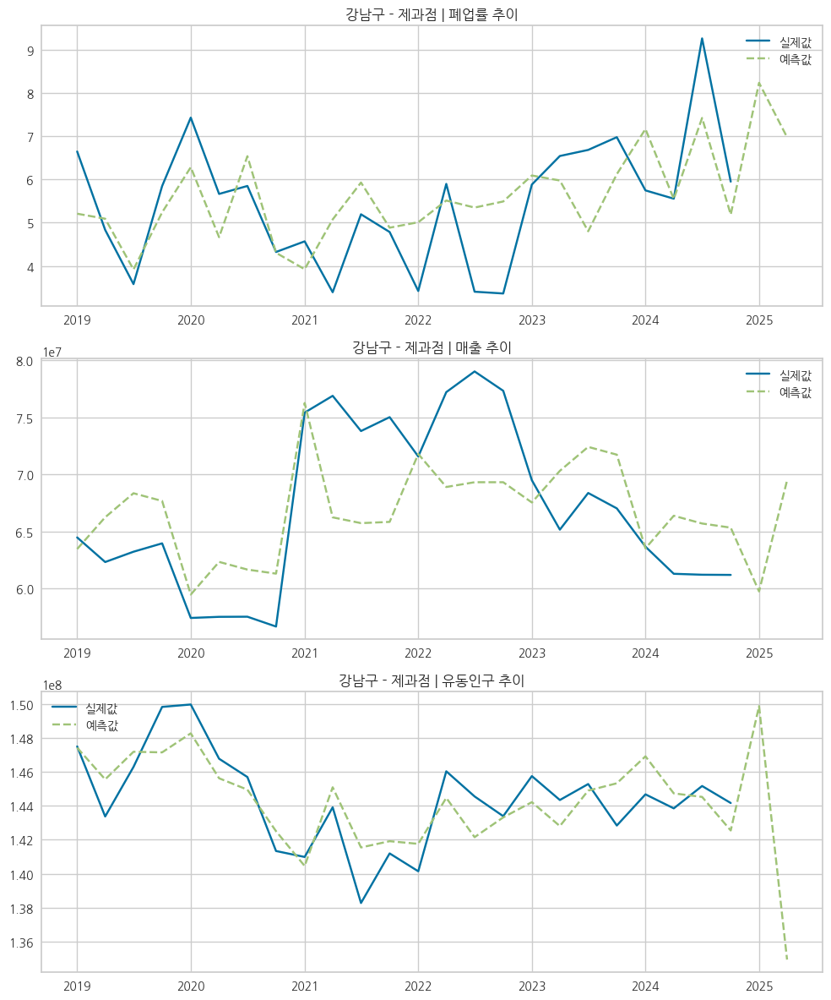

In [37]:
# 입력: 강남구, 제과점

# 자치구, 업종 설정
target_gu = '강남구'
target_upjong = '제과점'

# 예측 변수 목록
target_cols = {
    '폐업률': '폐업률 추이',
    '점포당_평균_매출': '매출 추이',
    '총_유동인구_수': '유동인구 추이'
}

# 기준 분기 코드 → 날짜 변환 함수
def convert_quarter_to_date(code):
    year = str(code)[:4]
    q = str(code)[-1]
    month = {'1': '01', '2': '04', '3': '07', '4': '10'}.get(q, '01')
    return pd.to_datetime(f"{year}-{month}-01")

# 시각화
fig, axes = plt.subplots(3, 1, figsize=(10, 12))

for i, (col, title) in enumerate(target_cols.items()):
    df_sub = df_merged[(df_merged['자치구'] == target_gu) & (df_merged['업종명'] == target_upjong)][['기준_년분기_코드', col]].dropna()
    if len(df_sub) < 4:
        continue

    df_sub['ds'] = df_sub['기준_년분기_코드'].apply(convert_quarter_to_date)
    df_sub = df_sub.rename(columns={col: 'y'})[['ds', 'y']]

    model = Prophet()
    model.fit(df_sub)

    future = model.make_future_dataframe(periods=2, freq='Q')
    forecast = model.predict(future)

    axes[i].plot(df_sub['ds'], df_sub['y'], label='실제값')
    axes[i].plot(forecast['ds'], forecast['yhat'], label='예측값', linestyle='--')
    axes[i].set_title(f"{target_gu} - {target_upjong} | {title}")
    axes[i].legend()

plt.tight_layout()
plt.show()


In [39]:
import folium
from folium.plugins import MarkerCluster

# 지도 중심 좌표: 서울 중심
map_center = [37.5665, 126.9780]
m = folium.Map(location=map_center, zoom_start=11)

# 사용자 업종 필터링
user_input_upjong = '전자상거래업'
df_filtered = df_all[df_all['업종명'] == user_input_upjong].copy()

# 추천 점수 기준 상위 N개 자치구 (예: 5개)
top_n = 5
df_top = df_filtered.sort_values(by='추천_점수', ascending=False).head(top_n)

# 마커 클러스터 생성
marker_cluster = MarkerCluster().add_to(m)

# 마커 추가
for _, row in df_top.iterrows():
    popup_text = (
        f"<b>{row['자치구']}</b><br>"
        f"추천 점수: {row['추천_점수']:.3f}<br>"
        f"예측 폐업률: {row['예측_폐업률']:.2%}<br>"
        f"예측 매출: {row['예측_매출']:.0f} 원<br>"
        f"예측 유동인구: {row['예측_유동인구']:.0f} 명"
    )
    folium.Marker(
        location=[row['위도'], row['경도']],
        popup=folium.Popup(popup_text, max_width=300),
        icon=folium.Icon(color='green', icon='info-sign')
    ).add_to(marker_cluster)

# 지도 출력
m


In [ ]:
# 매출이 음수가 나오고 있음
# Prophet은 내부적으로 선형/비선형 트렌드 + 계절성을 결합한 모델
# 선형 회귀 기반이라 입력 데이터가 적거나, 감소 추세가 지속되면 음의 기울기를 예측
# 예측값이 음수로 나오는 경우는 예측값을 0으로 설정


## train-test 나눈 버전

In [41]:
df_merged.head(3)

,기준_년분기_코드,자치구,업종명,대분류,점포수,폐업점포수,폐업률,year,총추정매출,총지출,평균소득,상권면적,총_유동인구_수,밀집도,점포당_평균_매출,유동인구_대비_점포,자치구_업종_점유율
0,20244,강동구,전자상거래업,소매/도소매,1100.0,63.0,5.727273,2024,60224799.0,417853383000,3292857.0,5761011,107151778,0.000191,54749.817273,1.026581e-05,0.002152
1,20244,강동구,주유소,자동차/운송,39.0,0.0,0.000000,2024,NaN,417853383000,3292857.0,5761011,107151778,0.000007,NaN,3.639697e-07,0.000076
2,20244,강동구,예술품,소매/도소매,26.0,0.0,0.000000,2024,NaN,417853383000,3292857.0,5761011,107151778,0.000005,NaN,2.426465e-07,0.000051


In [42]:
df_merged.isna().sum()

기준_년분기_코드         0
자치구               0
업종명               0
대분류            1200
점포수               0
폐업점포수             0
폐업률               0
year              0
총추정매출         22816
총지출               0
평균소득              0
상권면적              0
총_유동인구_수          0
밀집도               0
점포당_평균_매출     22795
유동인구_대비_점포        0
자치구_업종_점유율        0
dtype: int64

In [43]:
df_merged['점포당_평균_매출'].fillna(0, inplace=True)   
df_merged.head()

/var/folders/q9/1gz00szn5vz5011w8pll4_8h0000gn/T/ipykernel_9167/1965271755.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_merged['점포당_평균_매출'].fillna(0, inplace=True)


,기준_년분기_코드,자치구,업종명,대분류,점포수,폐업점포수,폐업률,year,총추정매출,총지출,평균소득,상권면적,총_유동인구_수,밀집도,점포당_평균_매출,유동인구_대비_점포,자치구_업종_점유율
0,20244,강동구,전자상거래업,소매/도소매,1100.0,63.0,5.727273,2024,60224799.0,417853383000,3292857.0,5761011,107151778,0.000191,54749.817273,1.026581e-05,0.002152
1,20244,강동구,주유소,자동차/운송,39.0,0.0,0.000000,2024,NaN,417853383000,3292857.0,5761011,107151778,0.000007,0.000000,3.639697e-07,0.000076
2,20244,강동구,예술품,소매/도소매,26.0,0.0,0.000000,2024,NaN,417853383000,3292857.0,5761011,107151778,0.000005,0.000000,2.426465e-07,0.000051
3,20244,강동구,재생용품 판매점,소매/도소매,47.0,0.0,0.000000,2024,NaN,417853383000,3292857.0,5761011,107151778,0.000008,0.000000,4.386301e-07,0.000092
4,20244,강동구,모터사이클및부품,자동차/운송,20.0,0.0,0.000000,2024,NaN,417853383000,3292857.0,5761011,107151778,0.000003,0.000000,1.866511e-07,0.000039


In [44]:
df_merged.isna().sum()

기준_년분기_코드         0
자치구               0
업종명               0
대분류            1200
점포수               0
폐업점포수             0
폐업률               0
year              0
총추정매출         22816
총지출               0
평균소득              0
상권면적              0
총_유동인구_수          0
밀집도               0
점포당_평균_매출         0
유동인구_대비_점포        0
자치구_업종_점유율        0
dtype: int64

In [67]:
from prophet import Prophet
from sklearn.metrics import mean_absolute_error, mean_squared_error
import pandas as pd

def convert_quarter_to_date(code):
    year = str(code)[:4]
    q = str(code)[-1]
    month = {'1': '01', '2': '04', '3': '07', '4': '10'}.get(q, '01')
    return pd.to_datetime(f"{year}-{month}-01")

def evaluate_all_variables(df_merged, gu, upjong, variables=['폐업률', '점포당_평균_매출', '총_유동인구_수'], test_periods=2):
    results = []

    for var in variables:
        df_sub = df_merged[(df_merged['자치구'] == gu) & (df_merged['업종명'] == upjong)][['기준_년분기_코드', var]].dropna()

        if len(df_sub) <= test_periods + 3:
            continue  # 데이터가 너무 적으면 건너뜀

        df_sub['ds'] = df_sub['기준_년분기_코드'].apply(convert_quarter_to_date)
        df_sub = df_sub.rename(columns={var: 'y'})[['ds', 'y']].sort_values(by='ds')

        # Train/Test 분할
        if len(df_sub) <= test_periods:
            continue  # 분할 불가 시 스킵

        train = df_sub.iloc[:-test_periods]
        test = df_sub.iloc[-test_periods:]

        if train.empty or test.empty:
            continue

        # Prophet 학습
        model = Prophet()
        model.fit(train)

        # 미래 예측
        future = model.make_future_dataframe(periods=test_periods, freq='Q')
        forecast = model.predict(future)

        # 예측 결과 병합
        df_result = forecast[['ds', 'yhat']].merge(test, on='ds', how='inner')
        if df_result.empty:
            continue

        # 정확도 평가
        mae = mean_absolute_error(df_result['y'], df_result['yhat'])
        rmse = mean_squared_error(df_result['y'], df_result['yhat'], squared=False)

        results.append({
            '자치구': gu,
            '업종명': upjong,
            '변수': var,
            'MAE': mae,
            'RMSE': rmse,
            'Test 샘플 수': len(df_result)
        })

    return pd.DataFrame(results)


In [64]:
from prophet import Prophet
from sklearn.metrics import mean_absolute_error, mean_squared_error
import pandas as pd

def convert_quarter_to_date(code):
    year = str(code)[:4]
    q = str(code)[-1]
    month = {'1': '01', '2': '04', '3': '07', '4': '10'}.get(q, '01')
    return pd.to_datetime(f"{year}-{month}-01")

def evaluate_all_variables(df_merged, gu, upjong, variables=['폐업률', '점포당_평균_매출', '총_유동인구_수'], test_periods=2):
    results = []

    for var in variables:
        df_sub = df_merged[(df_merged['자치구'] == gu) & (df_merged['업종명'] == upjong)][['기준_년분기_코드', var]].dropna()

        if len(df_sub) <= test_periods + 3:
            continue

        df_sub['ds'] = df_sub['기준_년분기_코드'].apply(convert_quarter_to_date)
        df_sub = df_sub.rename(columns={var: 'y'})[['ds', 'y']].sort_values(by='ds')

        # Train/Test 분할
        train = df_sub.iloc[:-test_periods]
        test = df_sub.iloc[-test_periods:]

        if len(train) < 3 or len(test) == 0:
            continue

        # Prophet 학습
        model = Prophet()
        model.fit(train)

        # 예측
        future = model.make_future_dataframe(periods=test_periods, freq='Q')
        forecast = model.predict(future)

        df_result = forecast[['ds', 'yhat']].merge(test, on='ds', how='inner')

        if df_result.empty:
            continue

        mae = mean_absolute_error(df_result['y'], df_result['yhat'])
        rmse = mean_squared_error(df_result['y'], df_result['yhat'], squared=False)

        results.append({
            '자치구': gu,
            '업종명': upjong,
            '변수': var,
            'MAE': mae,
            'RMSE': rmse,
            'Test 샘플 수': len(df_result)
        })

    return pd.DataFrame(results)


In [58]:
evaluate_all_variables(df_merged, '강남구', '전자상거래업')


16:36:23 - cmdstanpy - INFO - Chain [1] start processing
16:36:23 - cmdstanpy - INFO - Chain [1] done processing
/Users/leehyunjoo/Library/Python/3.9/lib/python/site-packages/prophet/forecaster.py:1854: FutureWarning: 'Q' is deprecated and will be removed in a future version, please use 'QE' instead.
  dates = pd.date_range(
16:36:23 - cmdstanpy - INFO - Chain [1] start processing
16:36:23 - cmdstanpy - INFO - Chain [1] done processing
/Users/leehyunjoo/Library/Python/3.9/lib/python/site-packages/prophet/forecaster.py:1854: FutureWarning: 'Q' is deprecated and will be removed in a future version, please use 'QE' instead.
  dates = pd.date_range(
16:36:23 - cmdstanpy - INFO - Chain [1] start processing
16:36:23 - cmdstanpy - INFO - Chain [1] done processing
/Users/leehyunjoo/Library/Python/3.9/lib/python/site-packages/prophet/forecaster.py:1854: FutureWarning: 'Q' is deprecated and will be removed in a future version, please use 'QE' instead.
  dates = pd.date_range(


""
